# Montreal Crime Data Analysis 
## Data from 2015 - 2021


This project aims to analyze crime data in the Greater city of Montreal from **2015 - 2021**.  

Original dataset (in French) is available on the [Ville de Montreal Données Ouvertes Websiste.](https://donnees.montreal.ca/)

In this project I have used an English dataset from Kaggle:
- [Kaggle dataset](https://www.kaggle.com/datasets/kalvainhindi/montral-crimes)

## Questions

1. Which Montreal neighbourhoods have a higher number of reported crimes?
2. Most frequent crimes by neighbourhood
3. Number of reported crimes committed annualy in Montreal
4. What are the general trends in the reported crimes from 2015-2021?
5. On what days and months are a higher number of crimes reported?

## Notebook Content

1. Step 1: Install + Import Necessary Libraries
2. Step 2: Reading + Exploring Data
3. Step 3: Data Cleaning + Preprocessing
4. Step 4: Data Analysis + Visualization & Final Results

## Step 1: Install + Import Necessary Libraries

In [ ]:
# !pip install plotly
# !pip install cufflink
# !pip install chart-studio

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objects as go

In [3]:
init_notebook_mode(connected=True)
cf.go_offline()

## Step 2: Reading + Exploring Data

In [68]:
data = pd.read_csv('mtl-crime-data.csv')

In [69]:
data.head()

,Unnamed: 0,category,date,postal_code,city,neighbourhood,year,count,longitude,latitude
0,0,Motor vehicle theft,2018-09-13,H1Z 1S9,MONTREAL,Saint-Michel,2018,1,-73.626,45.567
1,1,Motor vehicle theft,2018-04-30,H1Z 1S9,MONTREAL,Saint-Michel,2018,1,-73.626,45.567
2,2,Home Invasion,2018-01-10,H1Z 2V6,MONTREAL,Saint-Michel,2018,1,-73.629,45.569
3,3,Mischief,2018-11-12,H1Z 2V6,MONTREAL,Saint-Michel,2018,1,-73.629,45.569
4,4,Mischief,2018-08-15,H1Z 2V6,MONTREAL,Saint-Michel,2018,1,-73.629,45.569


In [67]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136642 entries, 0 to 136641
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   category       136642 non-null  object        
 1   date           136642 non-null  datetime64[ns]
 2   postal_code    136642 non-null  object        
 3   city           136642 non-null  object        
 4   neighbourhood  136642 non-null  object        
 5   year           136642 non-null  int64         
 6   count          136642 non-null  int64         
 7   longitude      136642 non-null  float64       
 8   latitude       136642 non-null  float64       
 9   Month          136642 non-null  int64         
 10  Day of Week    136642 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(3), object(5)
memory usage: 11.5+ MB


## Step 3: Cleaning + Preprocessing

In [14]:
data.columns

Index(['Unnamed: 0', 'category', 'date', 'postal_code', 'city',
       'neighbourhood', 'year', 'count', 'longitude', 'latitude'],
      dtype='object')

### Step 3.1: Removing unwanted columns

We will drop the "Unnamed" column as it is just used for indexing purposes, and doesn't include any values.

In [15]:
data = data.drop('Unnamed: 0', axis=1) #data cleaning and removing unwanted dolumns

In [16]:
data.columns

Index(['category', 'date', 'postal_code', 'city', 'neighbourhood', 'year',
       'count', 'longitude', 'latitude'],
      dtype='object')

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136642 entries, 0 to 136641
Data columns (total 9 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   category       136642 non-null  object 
 1   date           136642 non-null  object 
 2   postal_code    136642 non-null  object 
 3   city           136642 non-null  object 
 4   neighbourhood  136642 non-null  object 
 5   year           136642 non-null  int64  
 6   count          136642 non-null  int64  
 7   longitude      136642 non-null  float64
 8   latitude       136642 non-null  float64
dtypes: float64(2), int64(2), object(5)
memory usage: 9.4+ MB


### Step 3.2: Converting datatypes to required format

"Date" column is currently in string format, and we need it to be in datetime format in order to perform analysis.

In [20]:
data['date'] = pd.to_datetime(data['date'])

In [21]:
pd.DataFrame(data.dtypes, columns=['Datatype']).rename_axis('Columns')

,Datatype
Columns,
category,object
date,datetime64[ns]
postal_code,object
city,object
neighbourhood,object
year,int64
count,int64
longitude,float64
latitude,float64


### Step 3.3: Checking for null values

In [22]:
pd.DataFrame(data.isnull().sum(), columns=['Missing Values']).rename_axis('Feature')

,Missing Values
Feature,
category,0
date,0
postal_code,0
city,0
neighbourhood,0
year,0
count,0
longitude,0
latitude,0


Dataset doesn't include null values.

## Step 4: Data Analysis + Visualization

### Question 1: Which neighbourhoods have the highest number of reported crimes?

In [25]:
top_neighbourhood = pd.DataFrame(data['neighbourhood'].value_counts()).rename({"neighbourhood":"Case Reported"}, axis = 1).rename_axis("Neighbourhood").head(10)

top_neighbourhood.style.bar()

,Case Reported
Neighbourhood,
Plateau Mont-Royal,10844
Centre-Sud,7849
Downtown Montreal,7565
Mercier,7302
Montréal-Nord,6913
Rosemont,5907
Ahuntsic,5575
Petite-Patrie,5327
Saint-Laurent,5094


In [26]:
fig = px.bar(data_frame = np.log(top_neighbourhood),
             x = top_neighbourhood.index,
             y = 'Case Reported',
             color='Case Reported',
             template='plotly_dark',             
             title = "<b>Top 10 Neighbourhoods where most Crime are reported</b>")

fig.show()

In [27]:
fig = px.histogram(data,
                   x = 'category',
                   color='neighbourhood')

fig.show()

#### Analysis shows that the neighbourhoods with highest number of reported crimes in Montreal between 2015 - 2021 are:

1. Plateau Mont-Royal (total of 10844 reported crimes)
2. Centre-Sud (total of 7849 reported crimes)
3. Downtown Montreal (total of 7565 reported crimes)
4. Mercier (total of 7302 reported crimes)
5. Montréal-Nord (total of 6913 reported crimes)
6. Rosemont (total of 5907 reported crimes)
7. Ahuntsic (total of 5575 reported crimes)
8. Petite-Patrie (total of 5327 reported crimes)
9. Saint-Laurent (total of 5094 reported crimes)
10. Saint-Léonard (total of 4822 reported crimes)

### Question 2: What are the most frequent crimes by neighbourhood?

In [28]:
#Crime category in each neighborhoud

fig = px.treemap(data, path=['neighbourhood', 'category'],   
                  hover_data = ['category'],)


fig.show()

### Question 3: Number of reported crimes committed annualy in Montreal

In [70]:
pd.DataFrame(data['year'].value_counts()).rename({"year":"Case Reported"}, axis = 1).rename_axis("Year")

,Case Reported
Year,
2015,24222
2016,23407
2017,22611
2018,19419
2019,18650
2020,17786
2021,10547


#### Year with highest number of reported crimes

In [31]:
pd.DataFrame(data['year'].value_counts()).rename({"year":"Case Reported"}, axis = 1).rename_axis("Year").style.highlight_max()

,Case Reported
Year,
2015,24222
2016,23407
2017,22611
2018,19419
2019,18650
2020,17786
2021,10547


#### Year with lowest number of reported crimes

In [32]:
pd.DataFrame(data['year'].value_counts()).rename({"year":"Case Reported"}, axis = 1).rename_axis("Year").style.highlight_min()

,Case Reported
Year,
2015,24222
2016,23407
2017,22611
2018,19419
2019,18650
2020,17786
2021,10547


### Question 4: What are the general trends in the reported crimes between 2015-2021

1. What are the trends in the categories of reported crimes?
2. Did crime rates increase or decrease?

#### 1. What are the trends in the categories of reported crimes?

In [34]:
fig = px.histogram(data,
             x='year',
             color="category",
             barmode='group')

fig.show()

#### 2. Did crime rates increase or decrease?

In [40]:
year_wise_trend = data.groupby('year').sum(numeric_only=True).drop(['longitude', 'latitude'], axis = 1).rename({'count':"Case Reported"}, axis=1)

In [41]:
fig = px.line(year_wise_trend, x = year_wise_trend.index,
              y = 'Case Reported',
              text = year_wise_trend.index,
              title = "<b>Trend of Crime from 2015 to 2021</b>",
              template='ggplot2')

fig.update_traces(textposition="bottom right")
fig.show()

We can see that crime rates decreased from 2015-2021.

### Question 5: On what days and months are a higher number of crimes reported?

#### Let's explore the types of crime committed depending on the day of the week.

In [46]:
data['Month'] = data['date'].apply(lambda time: time.month)
data['Day of Week'] = data['date'].apply(lambda time: time.dayofweek)

In [47]:
dmap = {0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}
data['Day of Week'] = data['Day of Week'].map(dmap)

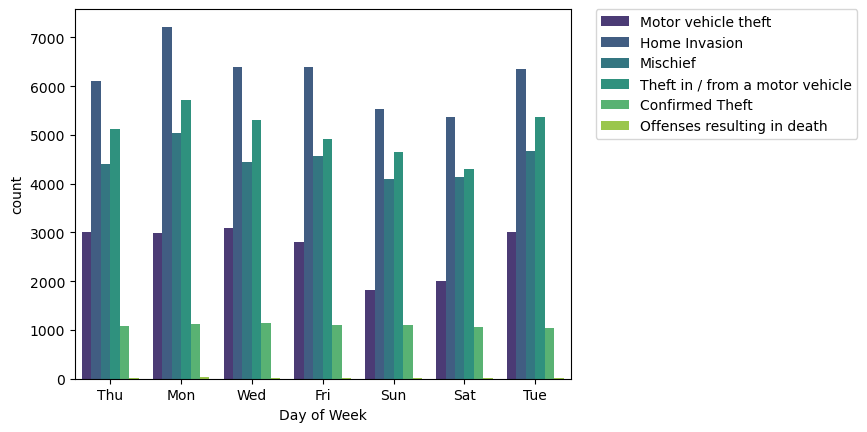

In [50]:
sns.countplot(x='Day of Week',data=data,hue='category',palette='viridis')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

We can see that Mondays seem to have higher rates of home invasions and mischief crimes, with no significant difference in the other categores.

Saturday and Sunday seem to have the lowest number of motor vehicle thefts.

#### Let's explore the types of crime committed depending on the month of the year.

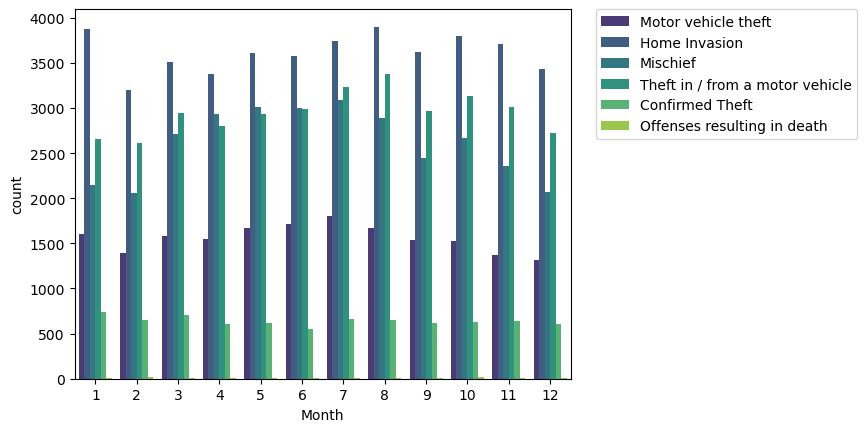

In [57]:
sns.countplot(x='Month', data=data, hue='category', palette='viridis')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

January and August seem to have the highest numbers of home invasions.

July and August seem to have the highest numbers of confirmed thefts.

#### Let's explore the overall correlation between the time of year and the reported number of crimes between 2015-2021.

Which days/months have the highest number of total reported crimes?

In [58]:
data.head()

,category,date,postal_code,city,neighbourhood,year,count,longitude,latitude,Month,Day of Week
0,Motor vehicle theft,2018-09-13,H1Z 1S9,MONTREAL,Saint-Michel,2018,1,-73.626,45.567,9,Thu
1,Motor vehicle theft,2018-04-30,H1Z 1S9,MONTREAL,Saint-Michel,2018,1,-73.626,45.567,4,Mon
2,Home Invasion,2018-01-10,H1Z 2V6,MONTREAL,Saint-Michel,2018,1,-73.629,45.569,1,Wed
3,Mischief,2018-11-12,H1Z 2V6,MONTREAL,Saint-Michel,2018,1,-73.629,45.569,11,Mon
4,Mischief,2018-08-15,H1Z 2V6,MONTREAL,Saint-Michel,2018,1,-73.629,45.569,8,Wed


In [59]:
#correlation between days/months

dayMonth = data.groupby(by=['Day of Week', 'Month']).count()['category'].unstack()
dayMonth.head()

Month,1,2,3,4,5,6,7,8,9,10,11,12
Day of Week,,,,,,,,,,,,
Fri,1706,1519,1630,1692,1685,1694,1809,1685,1590,1698,1624,1460
Mon,1742,1636,1830,1803,1872,1931,2068,2150,1743,1879,1802,1647
Sat,1372,1275,1371,1417,1443,1428,1459,1456,1425,1506,1345,1394
Sun,1299,1265,1420,1428,1550,1394,1587,1578,1487,1450,1470,1285
Thu,1734,1403,1652,1679,1685,1674,1818,1861,1521,1666,1607,1466


<Axes: xlabel='Month', ylabel='Day of Week'>

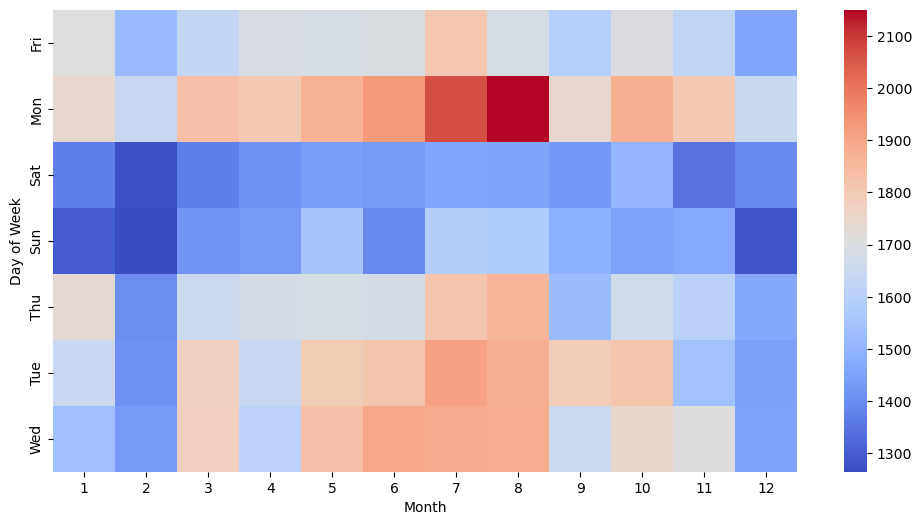

In [60]:
plt.figure(figsize=(12,6))
sns.heatmap(dayMonth,cmap='coolwarm')

Overall, Monday seems to have the highest number of reported crimes in the period between 2015-2021, followed by Tuesday and Wednesday. 

We can also see that June, July and August tend to have higher numbers of reported crimes.